# 0 - [Execute Once] Load Dataset Directly from Kaggle

*Reference*:
- [How to download Kaggle Datasets into Google Colab via Google Drive](https://medium.com/analytics-vidhya/how-to-download-kaggle-datasets-into-google-colab-via-google-drive-dcb348d7af07)

### Set up the notebook
- **Create new API Token** under Kaggle profile
- Upload downloaded kaggle.json file to the designated folder on Google Drive

In [ ]:
! pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# mount Google Drive to Google Colab notebook
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### Config Kaggle

In [ ]:
# set the Kaggle configuration path to kaggle.json
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/deep_learning"

In [ ]:
# change the working directory
%cd /content/gdrive/MyDrive/deep_learning/

/content/gdrive/MyDrive/deep_learning


### Download Dataset

Go to Kaggle datasets Dashboard and click on `Copy API Command`.

Note: The dataset is downloaded as a zip file. We use a keyword `--unzip` used to instantly unzip the file after download and delete the zip file.

In [ ]:
# !kaggle datasets download -d cookiefinder/tomato-disease-multiple-sources --unzip
!kaggle datasets download -d cookiefinder/tomato-disease-multiple-sources

100% 1.37G/1.37G [01:07<00:00, 25.1MB/s]
100% 1.37G/1.37G [01:07<00:00, 21.9MB/s]


In [ ]:
# check the file using 'ls' command
%ls

1_tl_exploratory-data-analysis.ipynb  kaggle.json
assignment/                           tomato-disease-multiple-sources.zip


In [ ]:
# [Alternative] download zipped datasets and manually unzip using python library
import zipfile
for file in os.listdir():
    if file.endswith(".zip"):
        with zipfile.ZipFile(file, "r") as zip_file:
            zip_file.extractall()
        os.remove(file)

In [ ]:
# audit: make sure we have 25,851 images in train and 6684 images in valid
train_len, test_len = 0, 0
TRAIN_DATA_PATH = '/content/gdrive/MyDrive/deep_learning/train'
VALID_DATA_PATH = '/content/gdrive/MyDrive/deep_learning/valid'

for f in os.listdir(TRAIN_DATA_PATH):
  train_len += len(os.listdir(os.path.join(TRAIN_DATA_PATH, f)))
  test_len += len(os.listdir(os.path.join(VALID_DATA_PATH, f)))

assert train_len == 25851, "Missing images in training set. It should include 25,851 images"
assert test_len == 6684, "Missing images in valid set. It should include 6,684 images"

# 1 - Set-up

In [ ]:
# install required packages
# !pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# data manipulation
import numpy as np
import pandas as pd

# image processing
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
sns.set_style('darkgrid')

# data preprocessing and modeling
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras.models import Model, load_model, Sequential

# sklearn utility functions
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

# others
import os, gc, time
import tqdm, re, json

# set up random seed
import random
seed = 24

# customize printing
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)
pd.set_option('max_colwidth', 200)

In [ ]:
# mount Google Drive to Google Colab notebook
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# environmental variables
TRAIN_DATA_PATH = '/content/gdrive/MyDrive/deep_learning/train'
VALID_DATA_PATH = '/content/gdrive/MyDrive/deep_learning/valid'

### Define dataframes for EDA and Train/Valid/Test Split

*Reference*:
- [Nitrogen deficiency for rice crop Pytorch](https://www.kaggle.com/code/jiaowoguanren/nitrogen-deficiency-for-rice-crop-pytorch-acc-0-99)
- [EffecientNetB3-Tomato-Disease-Detection-99.81](https://www.kaggle.com/code/abdallahwagih/effecientnetb3-tomato-disease-detection-99-81)

In [ ]:
def create_path_df(dir, quality_check=False):
  """
  This function creates dataframe with class labels and image paths.
    inputs: 
      - dir: image folders
      - quality_check: whether to check image quality. Increase processing time if sets to 'True'
    outputs:
      - df: dataframe
  """
  filepaths = []
  labels = []
  bad_images = []

  # validate directory
  assert os.path.exists(dir), "Error: directory does not exist"

  # get image paths
  classes = sorted([c for c in os.listdir(dir) if os.path.isdir(os.path.join(dir, c))])

  for f_class in classes:
    class_path = os.path.join(dir, f_class)
    file_list = os.listdir(class_path)
    desc = f'{f_class:23s}'
    for file in tqdm.tqdm(file_list, ncols=110, desc=desc, unit='file', colour='blue'):
      fpath = os.path.join(class_path, file)

      # if I want to check image quality - first time running
      if quality_check:
        index = file.rfind('.')
        if file[index:] in ['.jpg', '.png', '.jpeg', '.PNG', '.JPG', '.JPEG']:
          try:
            img = cv2.imread(fpath)
            filepaths.append(fpath)
            labels.append(f_class)
          except:
            bad_images.append(fpath)
            print('defective image file: ', fpath)
        else:
            bad_images.append(fpath)

      # skip image quality check
      filepaths.append(fpath)
      labels.append(f_class)

    # create dataframe with file paths
  Fseries = pd.Series(filepaths, name= 'filepaths')
  Lseries = pd.Series(labels, name='labels') 
  df = pd.concat([Fseries, Lseries], axis= 1)

  # summary outputs
  print('\n{} classes of images are imported. \n{} bad images'.format(df.shape[1], len(bad_images)))
  return df

In [ ]:
def df_split(dir_train, dir_valid, qa_train=False, qa_valid=False, seed=seed, split_ratio = 0.5):
  """
  This function creates dataframes with class labels and image paths and completes train/val/test split.
  """
  # train dataframe
  train_df = create_path_df(dir_train, qa_train)
  
  # valid and test dataframe
  val_test_df = create_path_df(dir_valid, qa_valid)
  strat = val_test_df['labels']
  valid_df, test_df = train_test_split(val_test_df,  train_size=split_ratio, stratify= strat, shuffle= True, random_state= seed)

  return train_df, valid_df, test_df

In [ ]:
train_df, valid_df, test_df = df_split(dir_train=TRAIN_DATA_PATH, dir_valid = VALID_DATA_PATH)

powdery_mildew         : 100%|██████████████████████████████████████| 1004/1004 [00:00<00:00, 196119.65file/s]



2 classes of images are imported. 
0 bad images


powdery_mildew         : 100%|████████████████████████████████████████| 252/252 [00:00<00:00, 198752.28file/s]



2 classes of images are imported. 
0 bad images


In [ ]:
for df in [train_df, valid_df, test_df]:
  df.info(verbose=True)
  df.sample(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25851 entries, 0 to 25850
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   filepaths  25851 non-null  object
 1   labels     25851 non-null  object
dtypes: object(2)
memory usage: 404.0+ KB


,filepaths,labels
7787,/content/gdrive/MyDrive/deep_learning/train/Late_blight/485022b7-b861-4234-a906-1034b3d0bda6___RS_Late.B 5984.JPG,Late_blight
3439,/content/gdrive/MyDrive/deep_learning/train/Early_blight/e2ce6add-93e2-4c1f-9ee3-2354d1542e8b___RS_Erly.B 7698_flipTB.JPG,Early_blight
11303,/content/gdrive/MyDrive/deep_learning/train/Septoria_leaf_spot/SS_ (740).jpg,Septoria_leaf_spot


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3342 entries, 3308 to 1769
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   filepaths  3342 non-null   object
 1   labels     3342 non-null   object
dtypes: object(2)
memory usage: 78.3+ KB


,filepaths,labels
2367,/content/gdrive/MyDrive/deep_learning/valid/Leaf_Mold/8130385a-3f81-4fd6-9966-6f392cf90329___Crnl_L.Mold 8753_180deg.JPG,Leaf_Mold
30,/content/gdrive/MyDrive/deep_learning/valid/Bacterial_spot/0fe8eb74-5520-4870-a069-d4f54b99d719___GCREC_Bact.Sp 6330.JPG,Bacterial_spot
3385,/content/gdrive/MyDrive/deep_learning/valid/Septoria_leaf_spot/SS_ (428).jpg,Septoria_leaf_spot


<class 'pandas.core.frame.DataFrame'>
Int64Index: 3342 entries, 741 to 1826
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   filepaths  3342 non-null   object
 1   labels     3342 non-null   object
dtypes: object(2)
memory usage: 78.3+ KB


,filepaths,labels
759,/content/gdrive/MyDrive/deep_learning/valid/Early_blight/11922494-321b-4742-afbe-f6db6a8b4005___RS_Erly.B 9392_180deg.JPG,Early_blight
297,/content/gdrive/MyDrive/deep_learning/valid/Bacterial_spot/BS_(207).jpg,Bacterial_spot
5324,/content/gdrive/MyDrive/deep_learning/valid/Tomato_mosaic_virus/9563b3bb-b942-4d32-9582-0b4021aaf116___PSU_CG 2229_270deg.JPG,Tomato_mosaic_virus


In [ ]:
# check image size
sample_df = train_df.sample(n=300, replace=False)
image_size_dict = dict()
for i in range(len(sample_df)):
    fpath = sample_df['filepaths'].iloc[i]
    try:
      img = cv2.imread(fpath)
      h_w = (img.shape[0], img.shape[1])
      image_size_dict[h_w] = image_size_dict.get(h_w, 0) + 1
    except:
        pass

{ k: v for k,v in image_size_dict.items() if v > 10}

{(256, 256): 215, (227, 227): 41, (640, 640): 19}

## 1 - Exploratory Data Analysis
- [X] Understand how data distributes in each class
- [X] Plot sample images for visual pattern analysis

In [ ]:
def dist_plots(df, var, df_name):
  """
  This funtion evaluates data distribution in each class and outputs bar plot and frequency table.
  """
  pd.options.display.float_format = '{:,.2%}'.format
  dist = pd.DataFrame({'count':df[var].value_counts(), 'percent':df[var].value_counts(normalize=True)})

  plt.figure(figsize=(16,10))
  ax = sns.barplot(x=dist['count'], y=dist.index, palette="viridis")
  patches = ax.patches
  for i in range(len(patches)):
    x = patches[i].get_x() + patches[i].get_width()*1.03
    y = i
    ax.annotate('{:.1%}'.format(dist['percent'][i]), (x, y), ha='center')
  plt.xlabel("Number of images", fontsize=12)
  plt.title("Data Distribution by Classes - {} Set".format(df_name), fontsize=16)
  plt.show()
  
  dist.sort_index(inplace=True)
  return dist

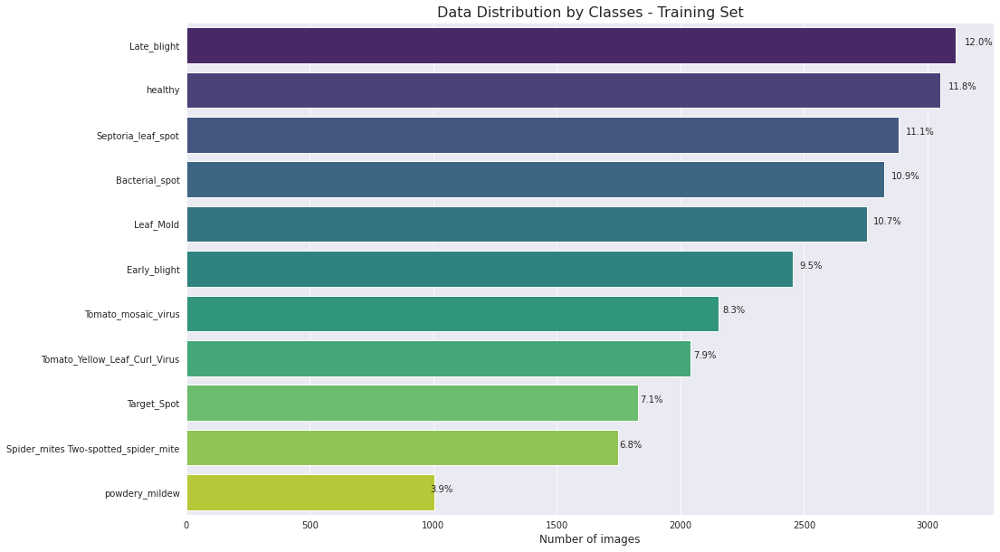

,count,percent
Bacterial_spot,2826,10.93%
Early_blight,2455,9.50%
Late_blight,3113,12.04%
Leaf_Mold,2754,10.65%
Septoria_leaf_spot,2882,11.15%
Spider_mites Two-spotted_spider_mite,1747,6.76%
Target_Spot,1827,7.07%
Tomato_Yellow_Leaf_Curl_Virus,2039,7.89%
Tomato_mosaic_virus,2153,8.33%
healthy,3051,11.80%


In [ ]:
dist_plots(train_df, 'labels', 'Training')

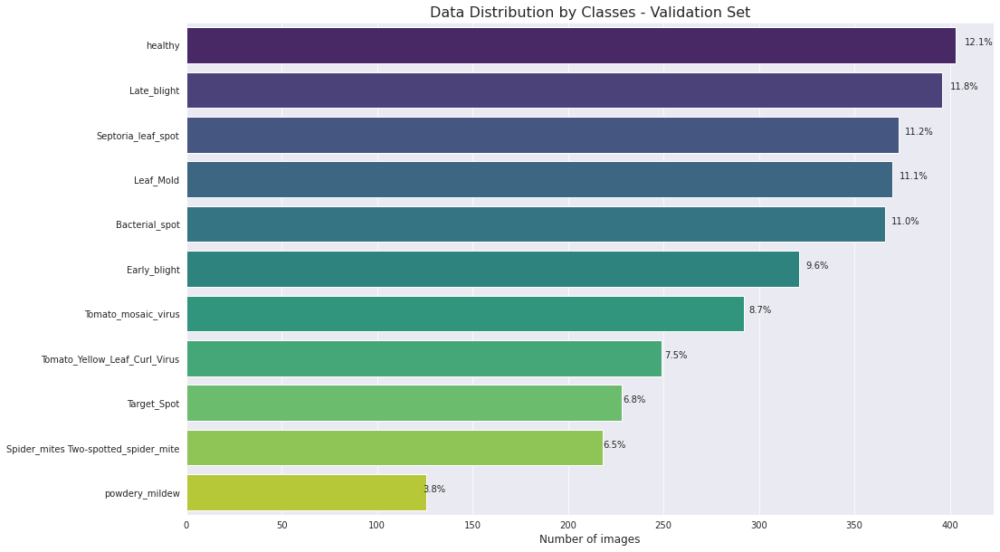

,count,percent
Bacterial_spot,366,10.95%
Early_blight,321,9.61%
Late_blight,396,11.85%
Leaf_Mold,370,11.07%
Septoria_leaf_spot,373,11.16%
Spider_mites Two-spotted_spider_mite,218,6.52%
Target_Spot,228,6.82%
Tomato_Yellow_Leaf_Curl_Virus,249,7.45%
Tomato_mosaic_virus,292,8.74%
healthy,403,12.06%


In [ ]:
dist_plots(valid_df, 'labels', 'Validation')

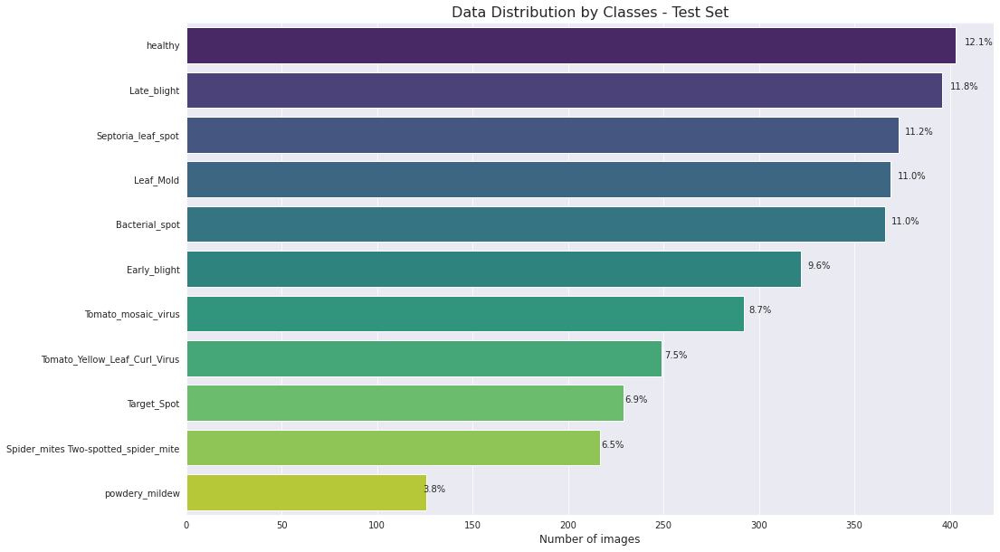

,count,percent
Bacterial_spot,366,10.95%
Early_blight,322,9.63%
Late_blight,396,11.85%
Leaf_Mold,369,11.04%
Septoria_leaf_spot,373,11.16%
Spider_mites Two-spotted_spider_mite,217,6.49%
Target_Spot,229,6.85%
Tomato_Yellow_Leaf_Curl_Virus,249,7.45%
Tomato_mosaic_virus,292,8.74%
healthy,403,12.06%


In [ ]:
dist_plots(test_df, 'labels', 'Test')

In [ ]:
# free up disk space
del sample_df, image_size_dict, create_path_df, df_split, dist_plots
gc.collect()

14040

## 2 - Image Data Generation

`tf.keras.preprocessing.image.ImageDataGenerator` generates batches of tensor image data with real-time data augmentation. However, `tf.keras.preprocessing.image.ImageDataGenerator` is deprecated and not recommended for new code. 

Prefer loading images with `tf.keras.utils.image_dataset_from_directory` and transforming the output `tf.data.Dataset` with `preprocessing layers`. 

*Reference*:
- [ImageDataGenerator](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator)
- [Tutorial on Keras flow_from_dataframe](https://vijayabhaskar96.medium.com/tutorial-on-keras-flow-from-dataframe-1fd4493d237c)
- [Load and preprocess images](https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator)
- [Data Augmentation](https://www.tensorflow.org/tutorials/images/data_augmentation)
- [Working with preprocessing layers](https://www.tensorflow.org/guide/keras/preprocessing_layers)

In [ ]:
#--------
# approach 1 - ImageDataGenerator
#--------
IMAGE_SIZE = 224 
BATCH_SIZE = 32
CLASS_MODE = 'categorical'  # one-hot encoded

train_datagen = ImageDataGenerator(rescale=1./255, 
                                   horizontal_flip = True,
                                   shear_range=0.2,
                                  # zoom_range=0.2,
                                  # rotation_range=10,
                                  )
test_datagen = ImageDataGenerator(rescale = 1./255)

train_ds = train_datagen.flow_from_dataframe(train_df, x_col = 'filepaths', y_col = 'labels', color_mode= 'rgb', shuffle= True, class_mode= CLASS_MODE, target_size=(IMAGE_SIZE, IMAGE_SIZE), batch_size= BATCH_SIZE, seed = seed)
valid_ds = test_datagen.flow_from_dataframe(valid_df, x_col = 'filepaths', y_col = 'labels', color_mode= 'rgb', shuffle= True, class_mode= CLASS_MODE, target_size=(IMAGE_SIZE, IMAGE_SIZE), batch_size= BATCH_SIZE, seed = seed)
test_ds = test_datagen.flow_from_dataframe(test_df, x_col = 'filepaths', y_col = 'labels', color_mode= 'rgb', shuffle= True, class_mode= CLASS_MODE, target_size=(IMAGE_SIZE, IMAGE_SIZE), batch_size= BATCH_SIZE, seed = seed)


Found 25851 validated image filenames belonging to 11 classes.
Found 3342 validated image filenames belonging to 11 classes.
Found 3342 validated image filenames belonging to 11 classes.


In [ ]:
def show_images(gen, num_batches=2):
    g_dict = gen.class_indices
    classes = list(g_dict.keys())
    images, labels = [], []
    for batch in range(num_batches):
      x, y = gen.next()
      images.extend(x)
      labels.extend(y)
    plt.figure(figsize= (16, (len(images)//4 + 1)*4))
    for i in range(len(images)):
      plt.subplot(len(images)//4 + 1, 4, i + 1)
      plt.imshow(images[i])
      index = np.argmax(labels[i])
      class_name = classes[index]
      plt.title(class_name, color= 'blue', fontsize= 12)
      plt.axis('off')
    plt.show()

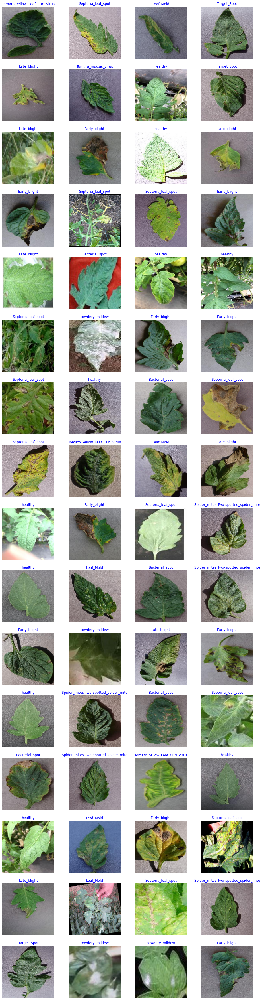

In [ ]:
show_images(train_ds)

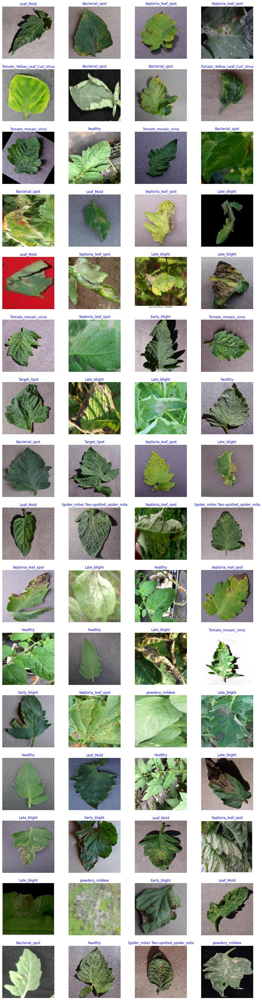

In [ ]:
show_images(valid_ds)

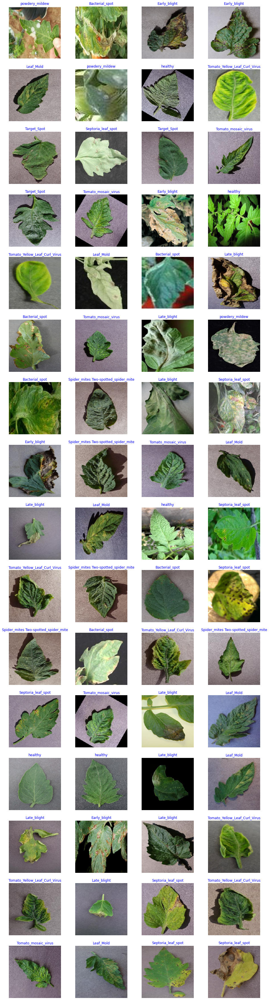

In [ ]:
show_images(test_ds)

In [ ]:
#--------
# approach 2 - Loading Data using new keras utility `tf.keras.utils.image_dataset_from_directory`
# https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory
#--------
# IMAGE_SIZE = 224 
# BATCH_SIZE = 32
# LABEL_MODE = 'categorical'

# train_ds = tf.keras.utils.image_dataset_from_directory(TRAIN_DATA_PATH, seed=seed, image_size=(IMAGE_SIZE, IMAGE_SIZE), batch_size=BATCH_SIZE, shuffle=True, labels='inferred',color_mode='rgb', label_mode = LABEL_MODE)
# val_test_ds = tf.keras.utils.image_dataset_from_directory(VALID_DATA_PATH, seed=seed, image_size=(IMAGE_SIZE, IMAGE_SIZE), batch_size=BATCH_SIZE, shuffle=True, labels='inferred',color_mode='rgb', label_mode = LABEL_MODE)

# val_batches = tf.data.experimental.cardinality(val_test_ds)
# valid_ds = val_test_ds.take((val_batches) // 2)
# test_ds = val_test_ds.skip((val_batches) // 2)

Found 25851 files belonging to 11 classes.
Found 6684 files belonging to 11 classes.
